# Principal Component Analysis

Unuspervised Learning

We don't know the outcome

Generally used to reduce a large dataset down to a smaller manageable one

Strips away the noise or uncorrelated data

We can use PCA to determine which data points are the most influential and then do analysis on those data points

Typically only used for analysis, not intended for delivering results


###### Pros

Great for cleaning or compressing large data sets into only the majority important components

Easy to export the dataset and feed it into a KMeans Clustering for futher grouping of data

###### Cons

It is strongly suggested to scale the data before fitting the data

Data is obfuscated so we don't know the original values from the original dataset

Knowing how to analyze the data is very difficult

Potentially strip away too much underlying data could have an impact on the future predictions

Have to manually choose the `n_component` value

### Get the Data

Breast Cancer Dataset from sklearn

`from sklearn.datasets import load_breast_cancer`

### How it works

Determines several orthogonal lines of best fit between the data

If we have 4 variables we will have a 4 dimensional space for the relations between all the variables

Finds Lines of Best Fit is then Splits those in half approx 50/50

The new orthogonal line of best fit splits into approx 4 x 25

The third lines of orthognal fit becomes approx 8 x 12.5

and so on...until data points are small enough to find some density

Densities in the data set reveal influence

Sparseness indicates noise


###### Example

Centering Data (Not Scaling to a specific value, but scaling to a range between 0 and 1)

`
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
`

This instantiates and selects the most important features from our dataset

`
model = PCA(n_components=4)
model_fit = model.fit_transform(X)
`

Put Results (`model_fit`) into a DataFrame

`
model_fit_df = pd.DataFrame(model_fit, columns=['col1', 'col2', 'col3', 'col4'])
`

Visuals

- Bar Plot of the influence of each category

`
plt.bar(range(model.n_components_), model.explained_variance_, color='blue')
`

- Scatter Plot of how PCA separated the data

`
ax.scatter(model_fit['col1'], model_fit['col2'], c=cancer.target)
`



### Evaluation

Weight of each component column

`model.explained_variance_`

Heatmap to get the most important columns (see behind the scenes)

`
df_comp = pd.DataFrame(model.components_, columns=cancer.feature_names)
sns.heatmap(df_comp)
`

### Use for Prediction

In this dataset we have the target so we can explor

We can train test split using the `pca_df` ex LogisticRegression

`
model_fit_df['Target'] = cancer.target
X = model_fit_df
y = model_fit_df['Target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
pred = model.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
`


In [46]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.datasets import load_breast_cancer

In [47]:
# Let's load our data

data = load_breast_cancer()



In [48]:
data

{'data': array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
         1.189e-01],
        [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
         8.902e-02],
        [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
         8.758e-02],
        ...,
        [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
         7.820e-02],
        [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
         1.240e-01],
        [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
         7.039e-02]]),
 'target': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
        1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
        1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
        1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0

In [49]:
# we don't need to create a dataframe but I will so we can explore the data

df = pd.DataFrame(data.data, columns=data.feature_names)

In [50]:
df['target'] = data.target

In [51]:
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

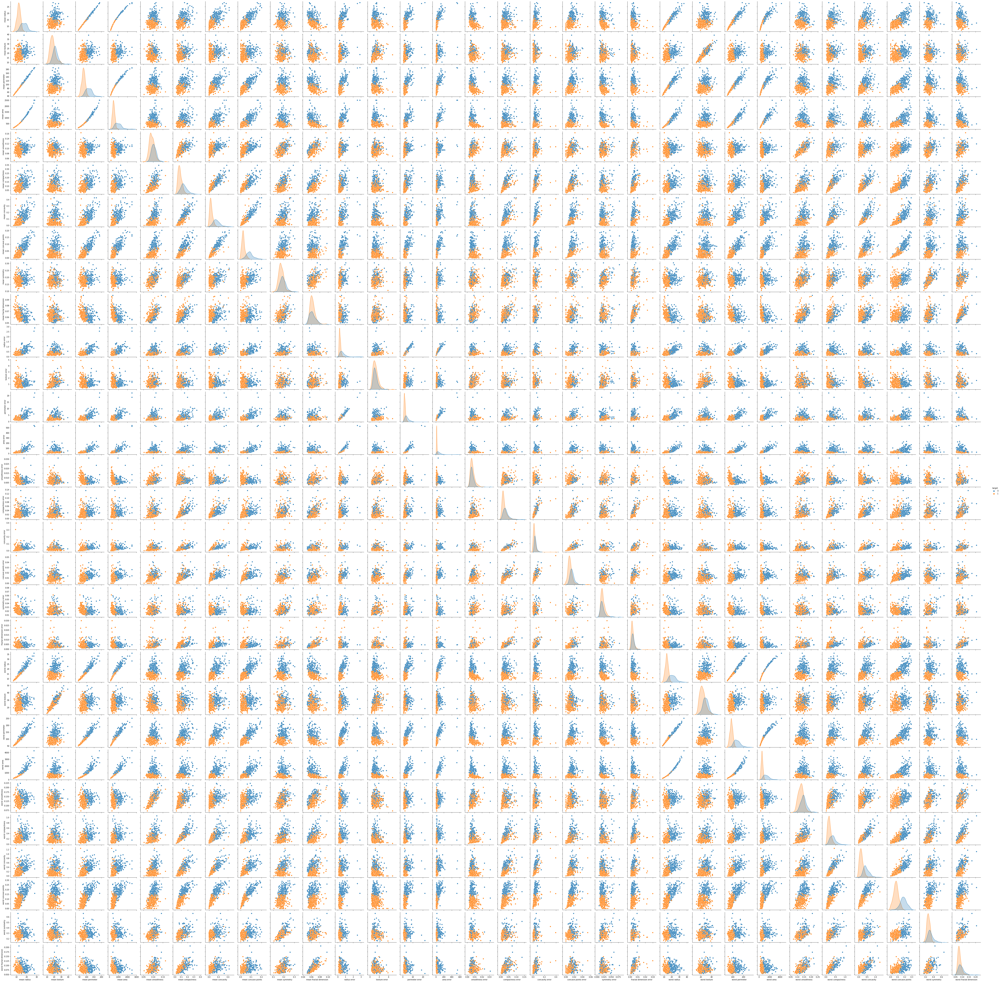

In [53]:
sns.pairplot(df, hue='target')

In [54]:
df.columns

Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension',
       'target'],
      dtype='object')

In [55]:
# Let's create an X value and apply minmaxScaler to the X values


X = df[df.columns[:-1]]

X.head()


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [64]:
# Scale using MinMaxScaler

# MinMax Scaler will reduce each colum to a float between 0 and 1

# MinMax is per column

# StandardScaler is for the entire dataframe

# If you want to use both together

# Use MinMaxScaler first and then StandardScaler on top of that


scaler = MinMaxScaler()

# We are going to create a dataframe for exploratory analysis but it's not necessary

X = pd.DataFrame(scaler.fit_transform(X), columns=df.columns[:-1])

X.head()




,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,0.521037,0.022658,0.545989,0.363733,0.593753,0.792037,0.703140,0.731113,0.686364,0.605518,...,0.620776,0.141525,0.668310,0.450698,0.601136,0.619292,0.568610,0.912027,0.598462,0.418864
1,0.643144,0.272574,0.615783,0.501591,0.289880,0.181768,0.203608,0.348757,0.379798,0.141323,...,0.606901,0.303571,0.539818,0.435214,0.347553,0.154563,0.192971,0.639175,0.233590,0.222878
2,0.601496,0.390260,0.595743,0.449417,0.514309,0.431017,0.462512,0.635686,0.509596,0.211247,...,0.556386,0.360075,0.508442,0.374508,0.483590,0.385375,0.359744,0.835052,0.403706,0.213433
3,0.210090,0.360839,0.233501,0.102906,0.811321,0.811361,0.565604,0.522863,0.776263,1.000000,...,0.248310,0.385928,0.241347,0.094008,0.915472,0.814012,0.548642,0.884880,1.000000,0.773711
4,0.629893,0.156578,0.630986,0.489290,0.430351,0.347893,0.463918,0.518390,0.378283,0.186816,...,0.519744,0.123934,0.506948,0.341575,0.437364,0.172415,0.319489,0.558419,0.157500,0.142595


In [75]:
# We can instantiate our PCA component and fit our model

model = PCA(n_components=10)
model.fit(X)




PCA(n_components=10)

In [76]:
model.feature_names_in_

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype=object)

In [77]:
# Look at the actual components and get a SNS Heatmap for these components and get an idea of where they came from

model.components_

array([[ 2.42675774e-01,  9.64786101e-02,  2.52550175e-01,
         2.16494530e-01,  1.09694618e-01,  2.40397602e-01,
         3.01914206e-01,  3.22475470e-01,  1.11431911e-01,
         4.32983397e-02,  1.21760615e-01, -3.91796003e-05,
         1.18580603e-01,  1.03569266e-01, -4.68418094e-03,
         1.29319789e-01,  6.56807080e-02,  1.24746120e-01,
         1.44902467e-02,  4.55013416e-02,  2.59386850e-01,
         1.13833007e-01,  2.60708399e-01,  2.05917767e-01,
         1.23773566e-01,  2.04993413e-01,  2.44083623e-01,
         3.71065064e-01,  9.59229054e-02,  9.46335142e-02],
       [-2.61316697e-01, -5.90579195e-02, -2.38590061e-01,
        -2.31106830e-01,  1.99883951e-01,  2.13914883e-01,
         1.13810591e-01, -8.31206237e-03,  2.11115126e-01,
         4.06392087e-01, -6.68985209e-02,  6.00114468e-02,
        -5.14164640e-02, -8.29631528e-02,  1.35596439e-01,
         2.22352585e-01,  1.02792720e-01,  1.05646780e-01,
         1.40474907e-01,  1.71995173e-01, -2.44281614e-

In [78]:
# We want to see the relationship between the components from the model and the actual datapoints from the dataframe
# Remember this data is obfuscated but we can still see the relationship

df_components = pd.DataFrame(model.components_, columns=model.feature_names_in_)

<AxesSubplot:>

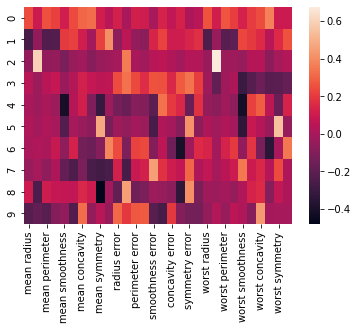

In [79]:
sns.heatmap(df_components)

In [80]:
df_components.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,0.242676,0.096479,0.252550,0.216495,0.109695,0.240398,0.301914,0.322475,0.111432,0.043298,...,0.259387,0.113833,0.260708,0.205918,0.123774,0.204993,0.244084,0.371065,0.095923,0.094634
1,-0.261317,-0.059058,-0.238590,-0.231107,0.199884,0.213915,0.113811,-0.008312,0.211115,0.406392,...,-0.244282,-0.039682,-0.211635,-0.198979,0.229455,0.198064,0.154982,0.044329,0.151169,0.258092
2,-0.059522,0.598472,-0.059326,-0.051718,-0.124019,-0.040102,-0.018927,-0.086422,-0.042714,-0.027881,...,-0.034687,0.675734,-0.031714,-0.025985,-0.047604,0.037560,0.032137,-0.071197,-0.006967,0.025389
3,0.039433,-0.033012,0.045797,0.078123,-0.034861,0.027957,0.122636,0.076789,0.060346,0.061840,...,-0.029289,-0.192668,-0.022012,0.012295,-0.302353,-0.221984,-0.164230,-0.216349,-0.210798,-0.176519
4,0.000588,-0.022870,0.004209,-0.031671,-0.410121,0.035253,0.115748,-0.107851,-0.313307,-0.030936,...,-0.049296,-0.079024,-0.022966,-0.066563,-0.421785,0.217076,0.282742,0.059724,-0.169638,0.128473


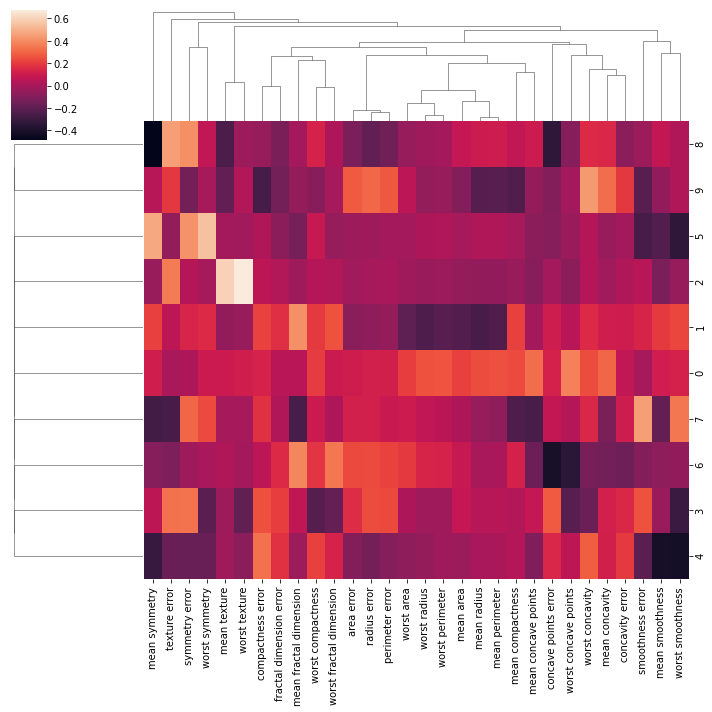

In [81]:
sns.clustermap(df_components)

<BarContainer object of 10 artists>

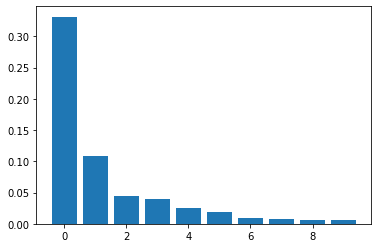

In [82]:
plt.bar(range(model.n_components_), model.explained_variance_)

In [83]:
# Let's the actual data and turn it into a dataframe

# Use the transform method to get the actual data

model = PCA(n_components=2)
model_output = model.fit_transform(X)


In [84]:
model_output

array([[ 1.38702121,  0.42689533],
       [ 0.46230825, -0.55694674],
       [ 0.95462147, -0.10970115],
       ...,
       [ 0.22631131, -0.28794577],
       [ 1.67783369,  0.33594595],
       [-0.90506804, -0.10410875]])

In [85]:
df_output = pd.DataFrame(model_output, columns=['col1', 'col2'])

In [86]:
df_output.head()

,col1,col2
0,1.387021,0.426895
1,0.462308,-0.556947
2,0.954621,-0.109701
3,1.000816,1.525089
4,0.626828,-0.302471


In [87]:
df_output.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   col1    569 non-null    float64
 1   col2    569 non-null    float64
dtypes: float64(2)
memory usage: 9.0 KB


In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [89]:
df_output['target'] = df['target']

In [91]:
df_output.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   col1    569 non-null    float64
 1   col2    569 non-null    float64
 2   target  569 non-null    int64  
dtypes: float64(2), int64(1)
memory usage: 13.5 KB


In [92]:
df_output.head()

,col1,col2,target
0,1.387021,0.426895,0
1,0.462308,-0.556947,0
2,0.954621,-0.109701,0
3,1.000816,1.525089,0
4,0.626828,-0.302471,0


In [93]:
# After adding in the target
# normally we would not have a target and we use KMeans or some other algorithm, but this time we do have a target



In [95]:
# Compare between Logistic Regression with the original DataFrame and this one

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

X = df[df.columns[:-1]]
y = df['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)




In [98]:
model = LogisticRegression(max_iter=5000)
model.fit(X_train, y_train)
pred = model.predict(X_test)

print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[ 61   2]
 [  2 106]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        63
           1       0.98      0.98      0.98       108

    accuracy                           0.98       171
   macro avg       0.97      0.97      0.97       171
weighted avg       0.98      0.98      0.98       171



In [100]:
# df_output from our PCA dataframe

X = df_output[df_output.columns[:-1]]
y = df_output['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)


In [102]:
model = LogisticRegression(max_iter=500)
model.fit(X_train, y_train)
pred_output = model.predict(X_test)

print(confusion_matrix(y_test, pred_output))
print(classification_report(y_test, pred_output))

[[ 56   7]
 [  2 106]]
              precision    recall  f1-score   support

           0       0.97      0.89      0.93        63
           1       0.94      0.98      0.96       108

    accuracy                           0.95       171
   macro avg       0.95      0.94      0.94       171
weighted avg       0.95      0.95      0.95       171



In [103]:

from sklearn.cluster import KMeans


In [104]:
X = df_output[['col1', 'col2']].values



In [105]:
inertias = []

for i in range(1,30):
    model = KMeans(n_clusters=i)
    model.fit(X)
    inertias.append(model.inertia_)
inertias

[249.45666732722736,
 110.97150878308139,
 83.37039929923291,
 67.79994685462054,
 55.84685319669047,
 46.36242330561308,
 40.87365017910908,
 36.01680888251799,
 33.33219718781544,
 29.84126035566166,
 26.873085310092765,
 24.46674358807263,
 22.649521456672858,
 20.689418856526476,
 19.064466116178107,
 17.661489062364236,
 16.729924479687924,
 15.5984434180147,
 14.649090245056342,
 14.065685113903694,
 13.171862093215847,
 12.678587875726205,
 11.748667595583894,
 11.41691582333519,
 10.935726589561849,
 10.574275108032104,
 10.090279425348744,
 9.720974126629027,
 9.397332213000904]

In [106]:
px.line(x=range(1,30), y=inertias)

In [107]:
model = KMeans(n_clusters=6)
model.fit(X)

KMeans(n_clusters=6)

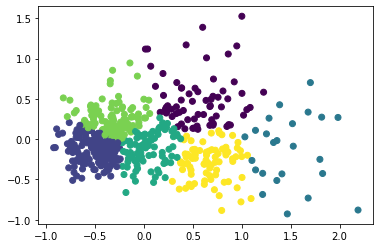

In [110]:
fig, ax = plt.subplots(1,1)
ax.scatter(x=df_output.loc[:, 'col1'], y=df_output.loc[:,'col2'], c=model.labels_)